# Cassava Leaf Disease Detection
- Jan Burian
- https://www.kaggle.com/competitions/cassava-leaf-disease-classification

## Modules import

In [152]:
import numpy as np
from pathlib import Path 
import os
import pandas as pd
import json 
import matplotlib.pyplot as plt
from PIL import Image

import wandb

from sklearn.model_selection import train_test_split 

import torch
import torchvision
import torchvision.transforms as transforms
from torchvision.transforms import ToTensor, Resize
from torch.utils.data import Dataset, DataLoader
from torchvision.io import read_image
import torch.nn.functional as F
import torch.nn as nn

In [45]:
!pip install timm
!pip install -U albumentations
!pip install wandb

Defaulting to user installation because normal site-packages is not writeable
Looking in indexes: https://pypi.org/simple, https://pypi.ngc.nvidia.com

[notice] A new release of pip is available: 23.2.1 -> 23.3.1
[notice] To update, run: python -m pip install --upgrade pip
Defaulting to user installation because normal site-packages is not writeable
Looking in indexes: https://pypi.org/simple, https://pypi.ngc.nvidia.com

[notice] A new release of pip is available: 23.2.1 -> 23.3.1
[notice] To update, run: python -m pip install --upgrade pip
Defaulting to user installation because normal site-packages is not writeable
Looking in indexes: https://pypi.org/simple, https://pypi.ngc.nvidia.com



[notice] A new release of pip is available: 23.2.1 -> 23.3.1
[notice] To update, run: python -m pip install --upgrade pip


## Preparing data

In [46]:
data_directory = Path('./data/cassava-leaf-disease-classification')
BASE_directory = os.path.join(os.getcwd(), data_directory)
!pwd # current working directory
print(BASE_directory)

/auto/brno2/home/jburian/ondemand
/auto/brno2/home/jburian/ondemand/data/cassava-leaf-disease-classification


In [4]:
train_csv = pd.read_csv(os.path.join(BASE_directory, 'train.csv'))
train_csv.head()

,image_id,label
0,1000015157.jpg,0
1,1000201771.jpg,3
2,100042118.jpg,1
3,1000723321.jpg,1
4,1000812911.jpg,3


## Training data analysis

In [5]:
def get_mapping_dictionary() -> dict:
    num_to_disease_map = open(os.path.join(BASE_directory, 'label_num_to_disease_map.json'))
    num_to_disease_map_dict = json.load(num_to_disease_map)
    num_to_disease_map_dict = {int(key):num_to_disease_map_dict[key] for key in num_to_disease_map_dict}
    
    return num_to_disease_map_dict


def pair_indices_and_class_names(class_distribution_dict: dict) -> dict:
    num_to_disease_map_dict = get_mapping_dictionary()
    
#     print(num_to_disease_map_dict)
    res_dict = {}
    
    for key in class_distribution_dict.keys():
        if key in num_to_disease_map_dict:
            new_key = num_to_disease_map_dict[key]
            res_dict[new_key] = class_distribution_dict[key]
    
#     print(class_distribution_dict)
    return res_dict

In [6]:
def visualize_class_distributions_training_data(mapped_class_distribution_dict: dict):
    fig, ax = plt.subplots()

    classes = list(mapped_class_distribution_dict.keys())
    counts = list(mapped_class_distribution_dict.values())
    bar_colors = ['tab:red', 'tab:blue', 'tab:orange', 'tab:purple', 'tab:green']

    ax.bar(classes, counts, color=bar_colors)

    for i, count in enumerate(counts):
        ax.text(classes[i], count + 10, str(count), ha='center', va='bottom')

    ax.set_xticks(classes)  # Use set_xticks to set the exact tick positions
    ax.set_xticklabels(classes, rotation=90)
    ax.set_ylabel('Number of training samples')
    ax.set_xlabel('Classes')
    ax.set_title('Number of samples in training data')

    plt.show()

{0: 1087, 3: 13158, 1: 2189, 2: 2386, 4: 2577}
{'Cassava Bacterial Blight (CBB)': 1087, 'Cassava Mosaic Disease (CMD)': 13158, 'Cassava Brown Streak Disease (CBSD)': 2189, 'Cassava Green Mottle (CGM)': 2386, 'Healthy': 2577}


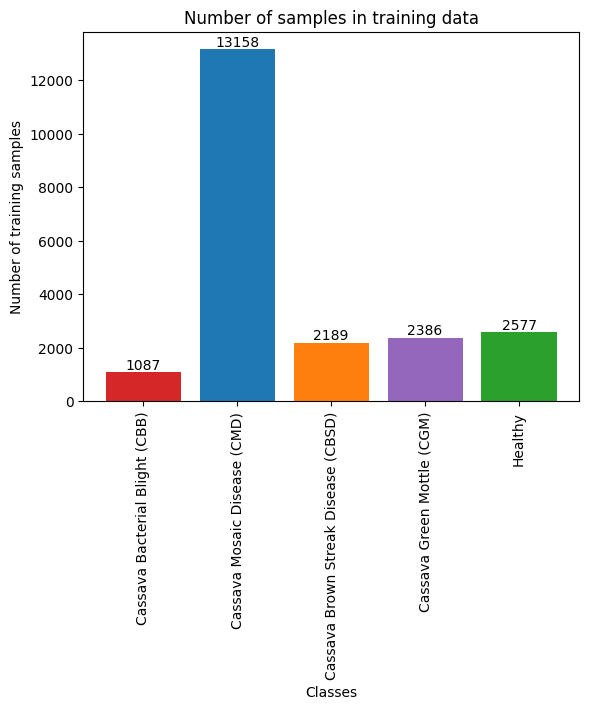

In [7]:
# Class distribution in training data
class_distribution_dict = {}
for i in range(len(train_csv)): 
#     print(train_csv.loc[i, "label"])
    key = train_csv.loc[i, "label"]
    
    if key not in class_distribution_dict:
        class_distribution_dict[key] = 1
        
    else:
        class_distribution_dict[key] += 1
        
print(class_distribution_dict)
mapped_class_distribution_dict = pair_indices_and_class_names(class_distribution_dict)
print(mapped_class_distribution_dict)
visualize_class_distributions_training_data(mapped_class_distribution_dict)

## Visualizing training data

In [8]:
train_images_dir = os.path.join(BASE_directory, 'train_images')
mapping_dictionary = get_mapping_dictionary()

def plot_n_training_images(n_images: int, train_csv: pd.DataFrame, number_classes: int):
    for j in range(number_classes):
        filtered_df = train_csv[train_csv['label'] == j]
        random_rows = filtered_df.sample(n_images)

        fig, axes = plt.subplots(1, n_images, figsize=(30, 5))  

        for i in range(len(random_rows)):
            image_id = random_rows.iloc[i]['image_id']
            label = random_rows.iloc[i]['label']

            class_name = mapping_dictionary[label]

            img_path = os.path.join(train_images_dir, image_id)
            img = Image.open(img_path)

            axes[i].imshow(img)
            axes[i].set_title(f'{class_name} ({image_id})')
            axes[i].axis('off')

        plt.show()

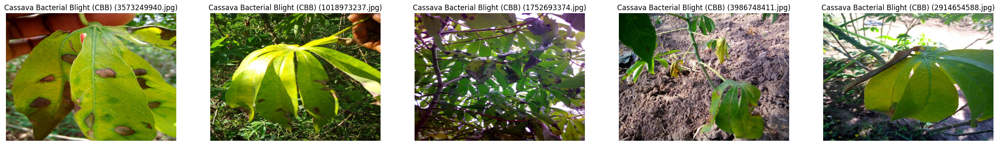

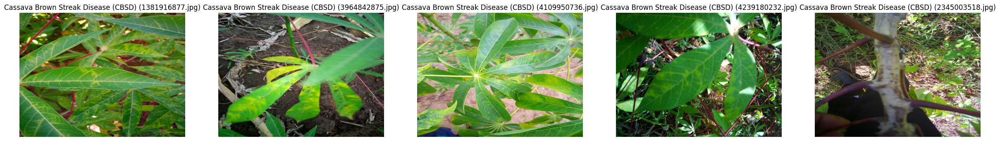

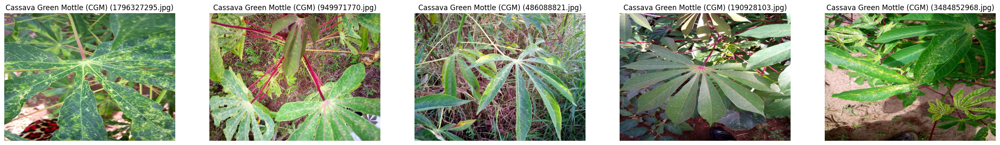

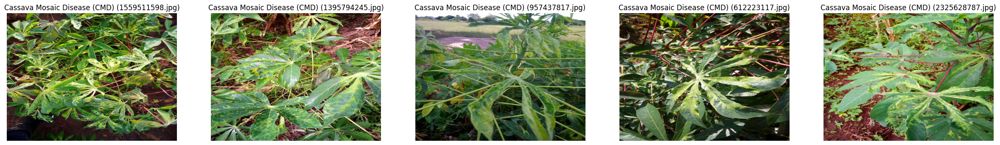

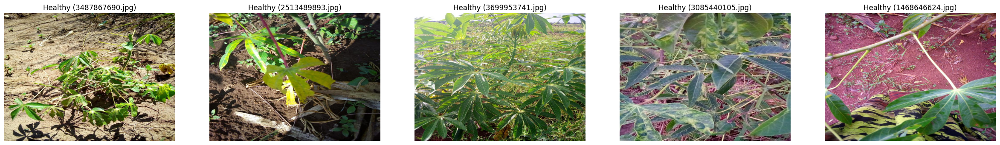

In [9]:
num_classes = len(mapped_class_distribution_dict)
plot_n_training_images(5, train_csv, 5)

## Dataset

In [110]:
# https://colab.research.google.com/github/pytorch/tutorials/blob/gh-pages/_downloads/f498e3bcd9b6159ecfb1a07d6551287d/data_loading_tutorial.ipynb#scrollTo=amZmMAzuGgTu
# https://pytorch.org/tutorials/beginner/data_loading_tutorial.html
# https://pytorch.org/tutorials/beginner/basics/data_tutorial.html

class CassavaLeafDataset(Dataset):
    def __init__(self, image_ids: list, labels: list, image_dir: str, dimension=(224, 224), transform=None):
        self.image_ids = image_ids
        self.labels = labels
        self.image_dir = image_dir
        self.dimension = dimension
        self.transform = transform
    
    # returns the length
    def __len__(self):
        return len(self.image_ids)
    
    # returns the image and label for that index
    def __getitem__(self, idx):
        img_path = os.path.join(self.image_dir, self.image_ids[idx])
        img = Image.open(img_path)
        label = self.labels[idx]
        
        
        if self.transform:
            img = self.transform(img)
        
        return img, label

In [136]:
# Parameters
batch_size = 32 # number of samples for training
num_workers = 1

resize_dimension = (224, 224)

device = "cuda"


# Splitting dataset into 3 parts
path_to_csv_file = os.path.join(BASE_directory, 'train.csv')
path_to_image_directory = os.path.join(BASE_directory, 'train_images')
print(path_to_image_directory)

train_csv = pd.read_csv(path_to_csv_file)

# Dividing data to train, validation and test subsets (60 % + 20 % + 20 %)
x_train, x_test, y_train, y_test = train_test_split(train_csv['image_id'], 
                                                    train_csv['label'], 
                                                    test_size=0.2, 
                                                    random_state=1) # Test data

# Dividing again obtained train data to get validation data and final train data
x_train, x_val, y_train, y_val = train_test_split(x_train, 
                                                  y_train, 
                                                  test_size=0.25, 
                                                  random_state=1) # 0.25 x 0.8 = 0.2 # Train and validation data


transform = transforms.Compose([
    transforms.Resize(resize_dimension, antialias=True),  # Resize the image
    transforms.ToTensor(),  # Convert to tensor
    transforms.Normalize((0.5, 0.5, 0.5), (0.5, 0.5, 0.5))  # Normalize the image
])

train_dataset = CassavaLeafDataset(
    image_ids=x_train.values,
    labels=y_train.values,
    image_dir=path_to_image_directory,
    dimension=dimension,
    transform=transform
)


val_dataset = CassavaLeafDataset(
    image_ids=x_val.values,
    labels=y_val.values,
    image_dir=path_to_image_directory,
    dimension=dimension,
    transform=transform
)

test_dataset = CassavaLeafDataset(
    image_ids=x_test.values,
    labels=y_test.values,
    image_dir=path_to_image_directory,
    dimension=dimension,
    transform=transform
)

/auto/brno2/home/jburian/ondemand/data/cassava-leaf-disease-classification/train_images


## DataLoader

In [137]:
train_loader = DataLoader(
    train_dataset,
    batch_size=batch_size,
    num_workers=num_workers,
    shuffle=True,
)


val_loader = DataLoader(
    val_dataset,
    batch_size=batch_size,
    num_workers=num_workers,
    shuffle=False
)


test_loader = DataLoader(
    test_dataset,
    batch_size=batch_size,
    num_workers=num_workers,
    shuffle=False
)


loaders = {'train': train_loader, 'val': val_loader, 'test': test_loader}

# print(len(x_train))
# print(len(y_train))
# print(len(x_val))
# print(len(y_val))
# print(len(x_test))
# print(len(y_test))

## Visualizing training data
from train_loader

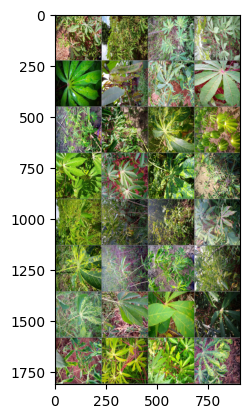

Healthy Cassava Mosaic Disease (CMD) Cassava Mosaic Disease (CMD) Cassava Green Mottle (CGM) Healthy Cassava Mosaic Disease (CMD) Cassava Mosaic Disease (CMD) Cassava Mosaic Disease (CMD) Cassava Mosaic Disease (CMD) Cassava Bacterial Blight (CBB) Cassava Mosaic Disease (CMD) Healthy Cassava Mosaic Disease (CMD) Cassava Brown Streak Disease (CBSD) Healthy Cassava Brown Streak Disease (CBSD) Cassava Mosaic Disease (CMD) Cassava Mosaic Disease (CMD) Cassava Mosaic Disease (CMD) Cassava Mosaic Disease (CMD) Cassava Mosaic Disease (CMD) Cassava Mosaic Disease (CMD) Cassava Brown Streak Disease (CBSD) Cassava Green Mottle (CGM) Cassava Mosaic Disease (CMD) Healthy Cassava Brown Streak Disease (CBSD) Cassava Mosaic Disease (CMD) Cassava Mosaic Disease (CMD) Cassava Mosaic Disease (CMD) Cassava Green Mottle (CGM) Cassava Mosaic Disease (CMD)


In [138]:
classes = list(get_mapping_dictionary().values())

# functions to show an image
def imshow(img):
    img = img / 2 + 0.5     # denormalization
    npimg = img.numpy()
    plt.imshow(np.transpose(npimg))
    plt.show()


# get some random training images
dataiter = iter(train_loader)
images, labels = next(dataiter)

# show images
imshow(torchvision.utils.make_grid(images))

# print labels
print(' '.join('%5s' % classes[labels[j]] for j in range(batch_size)))

## Usage of a pretrained model

In [139]:
from torchvision import models

In [140]:
dir(models) # available models and weights from torchvision

['AlexNet',
 'AlexNet_Weights',
 'ConvNeXt',
 'ConvNeXt_Base_Weights',
 'ConvNeXt_Large_Weights',
 'ConvNeXt_Small_Weights',
 'ConvNeXt_Tiny_Weights',
 'DenseNet',
 'DenseNet121_Weights',
 'DenseNet161_Weights',
 'DenseNet169_Weights',
 'DenseNet201_Weights',
 'EfficientNet',
 'EfficientNet_B0_Weights',
 'EfficientNet_B1_Weights',
 'EfficientNet_B2_Weights',
 'EfficientNet_B3_Weights',
 'EfficientNet_B4_Weights',
 'EfficientNet_B5_Weights',
 'EfficientNet_B6_Weights',
 'EfficientNet_B7_Weights',
 'EfficientNet_V2_L_Weights',
 'EfficientNet_V2_M_Weights',
 'EfficientNet_V2_S_Weights',
 'GoogLeNet',
 'GoogLeNetOutputs',
 'GoogLeNet_Weights',
 'Inception3',
 'InceptionOutputs',
 'Inception_V3_Weights',
 'MNASNet',
 'MNASNet0_5_Weights',
 'MNASNet0_75_Weights',
 'MNASNet1_0_Weights',
 'MNASNet1_3_Weights',
 'MaxVit',
 'MaxVit_T_Weights',
 'MobileNetV2',
 'MobileNetV3',
 'MobileNet_V2_Weights',
 'MobileNet_V3_Large_Weights',
 'MobileNet_V3_Small_Weights',
 'RegNet',
 'RegNet_X_16GF_Weights'

In [141]:
print(torch.cuda.is_available()) # availability of GPU

True


### Model initialization

In [142]:
class ImageClassificationModel(nn.Module):
    def __init__(self, num_classes):
        super(ImageClassificationModel, self).__init__()
        # Load a pretrained ResNet model
        self.pretrained_model = models.resnet50(weights='ResNet50_Weights.DEFAULT')
        
        # Modify the final fully connected layer to match the number of classes in your dataset
        in_features = self.pretrained_model.fc.in_features
        self.pretrained_model.fc = nn.Linear(in_features, num_classes)

    def forward(self, x):
        return self.pretrained_model(x)

In [149]:
def train_classification_model(train_loader, val_loader, num_epochs, learning_rate):
    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

    # Define the model
    num_classes = 5
    model = ImageClassificationModel(num_classes).to(device)

    # Define the loss function and optimizer
    criterion = nn.CrossEntropyLoss()
    optimizer = torch.optim.Adam(model.parameters(), lr=learning_rate)

    # Training loop
    for epoch in range(num_epochs):
        model.train()
        for inputs, labels in train_loader:
            inputs, labels = inputs.to(device), labels.to(device)
            optimizer.zero_grad()
            outputs = model(inputs)
            loss = criterion(outputs, labels)
            loss.backward()
            optimizer.step()

        # Validation loop
        model.eval()
        correct = 0
        total = 0
        with torch.no_grad():
            for inputs, labels in val_loader:
                inputs, labels = inputs.to(device), labels.to(device)
                outputs = model(inputs)
                _, predicted = torch.max(outputs.data, 1)
                total += labels.size(0)
                correct += (predicted == labels).sum().item()

        accuracy = correct / total
        print(f'Epoch [{epoch+1}/{num_epochs}], Accuracy: {accuracy:.4f}')

    print('Training finished.')
    return model

In [150]:
def test_classification_model(model, test_loader):
    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
    
    model.eval()
    correct = 0
    total = 0
    
    with torch.no_grad():
        for inputs, labels in test_loader:
            inputs, labels = inputs.to(device), labels.to(device)
            outputs = model(inputs)
            _, predicted = torch.max(outputs.data, 1)
            total += labels.size(0)
            correct += (predicted == labels).sum().item()

    accuracy = correct / total
    print(f'Test Accuracy: {accuracy:.4f}')

In [151]:
trained_model = train_classification_model(train_loader, val_loader, num_epochs=20, learning_rate=0.001)

Epoch [1/20], Accuracy: 0.7932
Epoch [2/20], Accuracy: 0.7619
Epoch [3/20], Accuracy: 0.8033
Epoch [4/20], Accuracy: 0.7953
Epoch [5/20], Accuracy: 0.8082
Epoch [6/20], Accuracy: 0.8084
Epoch [7/20], Accuracy: 0.8049
Epoch [8/20], Accuracy: 0.7654
Epoch [9/20], Accuracy: 0.7949
Epoch [10/20], Accuracy: 0.7984
Epoch [11/20], Accuracy: 0.7848
Epoch [12/20], Accuracy: 0.7998
Epoch [13/20], Accuracy: 0.7986
Epoch [14/20], Accuracy: 0.8051
Epoch [15/20], Accuracy: 0.8110
Epoch [16/20], Accuracy: 0.8047
Epoch [17/20], Accuracy: 0.8126
Epoch [18/20], Accuracy: 0.7766
Epoch [19/20], Accuracy: 0.7998
Epoch [20/20], Accuracy: 0.8014
Training finished.


In [154]:
test_classification_model(trained_model, test_loader)

Test Accuracy: 0.8110


In [161]:
trained_models_directory = Path('./trained_models/')
output_directory = os.path.join(os.getcwd(), trained_models_directory)
print(os.path.exists(output_directory))
torch.save(trained_model.state_dict(), os.path.join(output_directory, "model_resnet_50.pth"))

True
